# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using  TensorFlow 2.7 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given image of the a dog.

## 2. Data

The data we're using from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning 
* There are 120 breeds of dogs(this means there are 120 different classes).
* There are around 10,000+ images in training set (these images have labels)
* There are around 10,000+ images in test set (these images have no label, because we'll want to predict them)

In [3]:
# Unzip the uploaded into google Drive. 
# ************Uncomment below line if running for the first time********************
# !unzip "drive/My Drive/Projects/ML/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Projects/ML/Dog Vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/My Drive/Projects/ML/Dog Vision/train/83fbbcc9a612e3f712b1ba199da6

## Get our workplace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [4]:
# Uncomment below code to check if the CPU vs GPU
# %tensorflow_version 2.x
# import tensorflow as tf
# import timeit

# device_name = tf.test.gpu_device_name()
# if device_name != '/device:GPU:0':
#   print(
#       '\n\nThis error most likely means that this notebook is not '
#       'configured to use a GPU.  Change this in Notebook Settings via the '
#       'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
#   raise SystemError('GPU device not found')

# def cpu():
#   with tf.device('/cpu:0'):
#     random_image_cpu = tf.random.normal((100, 100, 100, 3))
#     net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
#     return tf.math.reduce_sum(net_cpu)

# def gpu():
#   with tf.device('/device:GPU:0'):
#     random_image_gpu = tf.random.normal((100, 100, 100, 3))
#     net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
#     return tf.math.reduce_sum(net_gpu)
  
# # We run each op once to warm up; see: https://stackoverflow.com/a/45067900
# cpu()
# gpu()

# # Run the op several times.
# print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
#       '(batch x height x width x channel). Sum of ten runs.')
# print('CPU (s):')
# cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
# print(cpu_time)
# print('GPU (s):')
# gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
# print(gpu_time)
# print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

In [5]:
# Standard Imports
import tensorflow as tf
import tensorflow_hub as hub
print("TF version :", tf.__version__)
print("TF version :", hub.__version__)

# Checking for GPU avilability
print('GPU', 'avilable (YESSSS!!!!!!)' if tf.config.list_physical_devices('GPU') else 'not available : (')

TF version : 2.7.0
TF version : 0.12.0
GPU avilable (YESSSS!!!!!!)


Note : To see recommendations or auto-complete press `Ctrl + space`.

To see Docstring : Press `Ctrl + Shift + space`

## Getting our data ready (turning into tensors)

With all the machine learning models, our data has to be in numerical format. Turning images into Tensors (numerical representation)

Let's start by accessing our data and checking out labels

In [14]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/My Drive/Projects/ML/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     7255557ff8ddf8da70e1efb260830eda  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [15]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


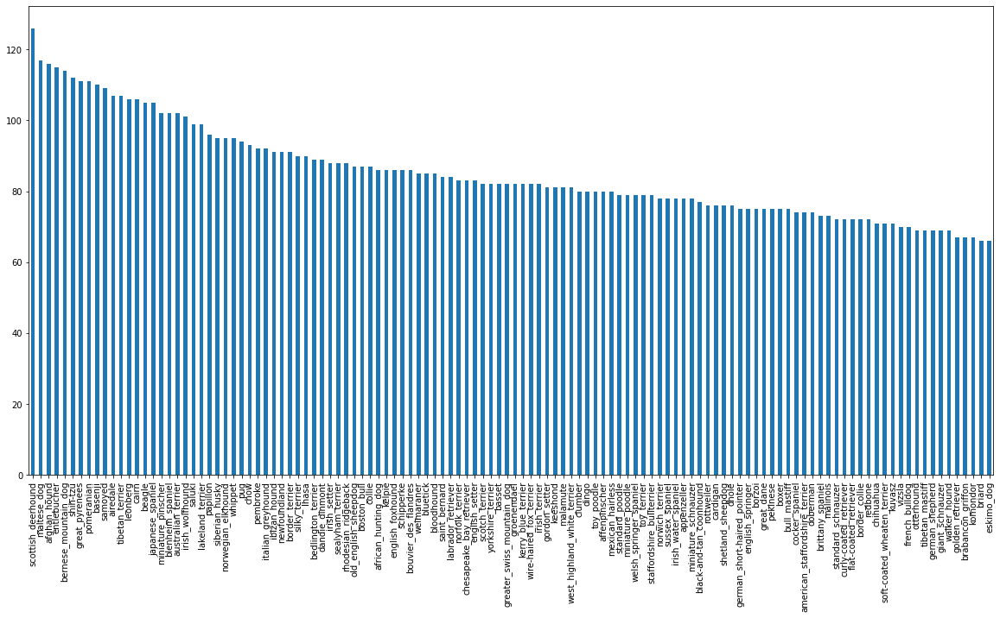

In [16]:
# How many images are there of each bread ?
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [17]:
labels_csv['breed'].value_counts().median()

82.0

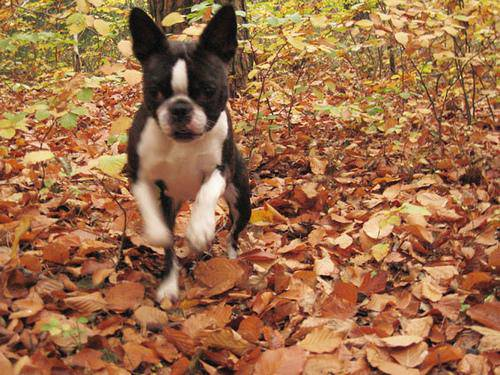

In [18]:
# Let's view an image
from IPython.display import Image
Image('drive/My Drive/Projects/ML/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')


## Getting images and their labels

Let's get a list of all of our image file pathnames

In [19]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [20]:
# Create pathnames from image id's
filenames = ['drive/My Drive/Projects/ML/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]


['drive/My Drive/Projects/ML/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [21]:
# Checking train files...
import os
os.listdir('drive/My Drive/Projects/ML/Dog Vision/train/')[:10]

['000bec180eb18c7604dcecc8fe0dba07.jpg',
 '001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '001cdf01b096e06d78e9e5112d419397.jpg',
 '00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '002211c81b498ef88e1b40b9abf84e1d.jpg',
 '00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '002a283a315af96eaea0e28e7163b21b.jpg',
 '003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '0042188c895a2f14ef64a918ed9c7b64.jpg']

In [22]:
# Check whether number of filenames matches no. of actual image files
import os
if len(os.listdir('/content/drive/MyDrive/Projects/ML/Dog Vision/train/')) == len(filenames):
  print("Filenames matched... Let's Proceed")
else:
  print("Filenames aren't matched... Don't Proceed")

Filenames matched... Let's Proceed


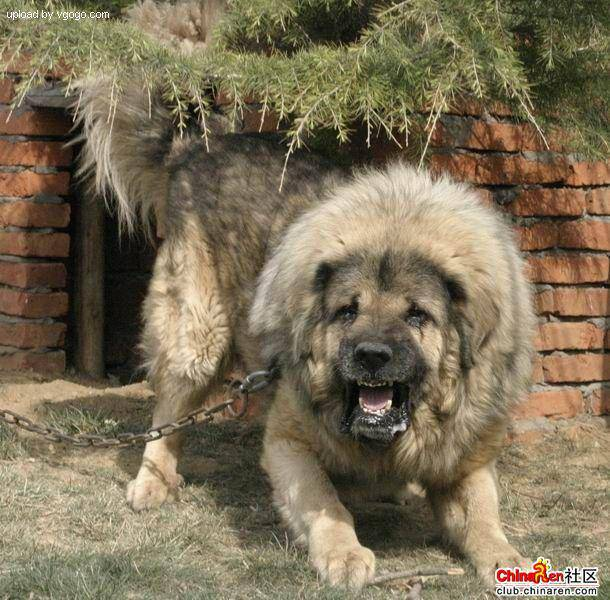

In [24]:
# One more check
Image(filenames[9000])

In [25]:
labels_csv.breed[9000]

'tibetan_mastiff'

In [26]:
import numpy as np
# labels = labels_csv['breed'].to_numpy() # both are the same thing..
labels = labels_csv['breed'] # both are the same thing..
labels = np.array(labels) # both are the same thing..
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [27]:
len(labels)

10222

In [28]:
# See if number of labels matches the no. of filenames
if len(labels) == len(filenames):
  print('Number of lables matches == no. of filenames')
else:
  print("Number of lables don't matches != no. of filenames")

Number of lables matches == no. of filenames


In [29]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [30]:
len(unique_breeds)

120

In [31]:
# Turn a single label into an array of booleans
print(labels[34])
labels[34] == unique_breeds # this line returns a boolean array... of false value but true only at 34 index.

walker_hound


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False])

In [32]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [33]:
len(boolean_labels)

10222

In [34]:
# Example: Turning boolean array into integers
print(labels[0]) # orignal label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean arrays
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [35]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [36]:
filenames[:10]

['drive/My Drive/Projects/ML/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

# Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own

In [37]:
# Setup X & y
X = filenames
y = boolean_labels

In [38]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed

In [40]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [41]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size of NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size= 0.2,
                                                   random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [42]:
# Let's have a geez at the training data
X_train[:2], y_val[:2]

(['drive/My Drive/Projects/ML/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Projects/ML/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False

# Preprocessing Images (turning images into Tensors)

To preprocess our images into tensors we're going to write a function which does few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize images (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be the shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing a image look like.

In [43]:
# Convert a image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape
# return np.array of rgb values (red, blue, green)

(257, 350, 3)

In [44]:
image.max(), image.min()

(255, 0)

In [45]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image look like in Tensor, let's make a function to pre process them

In [47]:
# Define image size
IMG_SIZE = 224 

# create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turn images into Tensor.
  """

  # Read in an iamge file
  image = tf.io.read_file(image_path)

  #Turn the jpeg image into numerical Tensor with 3 color channel (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel; values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  
  return image

## Turning our data into batches

Why turn our data into baches?

Let's say you're trying to process 10K+ images in one go... they might not fit into memory.

So that's why we do about 32(this is the batch size) images at a time(you can manually adjust the batch's size if needed be).

Inorder to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this :

In [49]:
# Create a simple function to return a tuple(image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  process the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [50]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42])) # both are the same thing......

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [51]:
get_image_label(X[42], y[42]) # both are the same thing......

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data(x &y) into batches!.

In [52]:
# Define the bath size, 32 is good start
BATCH_SIZE = 32

# Create a function to turn our data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it.
  elif valid_data:
    print('Creating validation data batches....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y)))# labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print("Creating training data batches...")

    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    
    # Shuffling pathnames and labels before mapping image preprocessing function is faster than shuffling
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [53]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches....


In [54]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to understand/comprehend, let's visualize them!

In [55]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [56]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.47140232, 0.54627955, 0.6023635 ],
          [0.40317824, 0.47713658, 0.49771607],
          [0.35664213, 0.43576857, 0.4008059 ],
          ...,
          [0.0426546 , 0.08960722, 0.01149446],
          [0.01706518, 0.0433818 , 0.02499678],
          [0.02732903, 0.06454839, 0.06062682]],
 
         [[0.51851296, 0.63496083, 0.68252736],
          [0.47011074, 0.5835235 , 0.61000913],
          [0.35422084, 0.46063718, 0.43891448],
          ...,
          [0.03163334, 0.07477059, 0.00846632],
          [0.10526318, 0.14840043, 0.11939568],
          [0.12696058, 0.17009783, 0.15432402]],
 
         [[0.51726836, 0.6780164 , 0.7093575 ],
          [0.498554  , 0.65312326, 0.67246854],
          [0.33315817, 0.47712693, 0.46390337],
          ...,
          [0.02144611, 0.06189604, 0.01321779],
          [0.04915984, 0.08960976, 0.05633251],
          [0.05997117, 0.1004211 , 0.07151704]],
 
         ...,
 
         [[0.75551057, 0.6927655 , 0.592039  ],
          [0.62302

In [57]:
len(train_images), len(train_labels)

(32, 32)

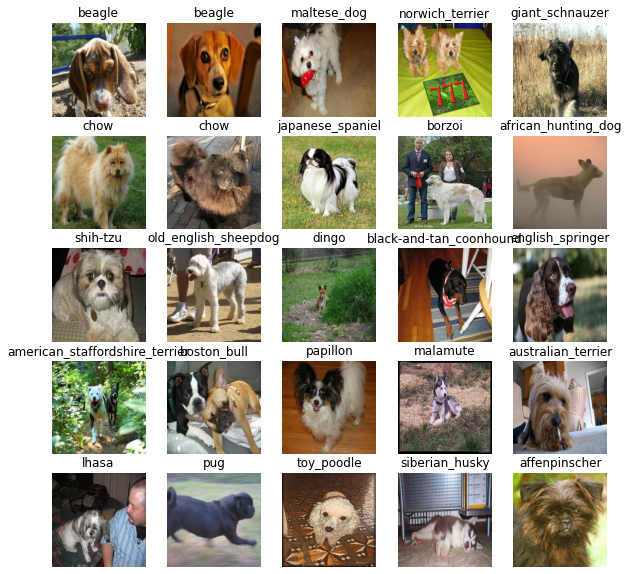

In [58]:
# Now Let's visualize the data in a training batch
show_25_images(train_images, train_labels)

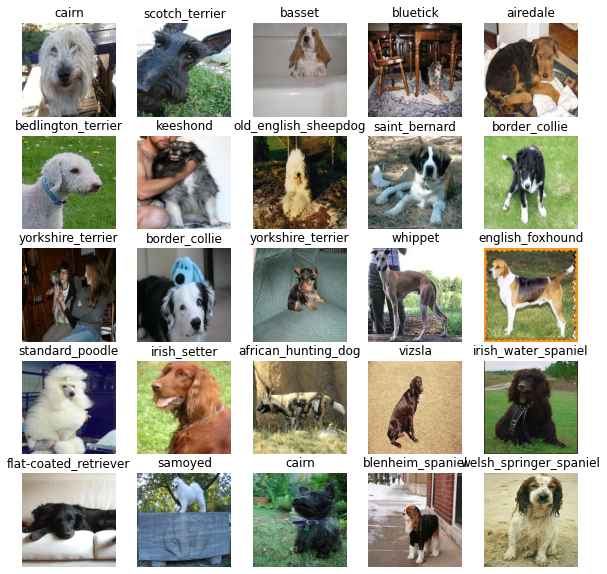

In [59]:
# Now let's visualize the data in validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image, labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [60]:
# Setup the input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameter.

* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).

* Compiles the model (says it should be evaluated and improved).

* Builds the model (tells model the input shape it'll be getting). 

* Returns the model.

All of these steps can be found here : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [62]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with : ',MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
  hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
  tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                        activation='softmax')  # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']   
  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [63]:
model = create_model()
model.summary()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
  1. Load the TensorBoard notebook extension.
  2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
  3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [64]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [66]:
import datetime

# Create a function to build TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/My Drive/Projects/ML/Dog Vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment 
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [67]:
# Create an early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

### Trainning a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working...

In [69]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}


In [70]:
# Check to make sure we're still running on a GPU
print('GPU', 'available (YES!!!!)' if tf.config.list_physical_devices('GPU') else 'Gpu is not available : (')

GPU available (YES!!!!)


# Let's Create a function which trains a model

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit` function on our model passing it to training data, validation data, no. of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use/
* Return the model.

In [71]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [72]:
# Fit the model to the data
model = train_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 20s 277ms/step - loss: 4.5301 - accuracy: 0.0913 - val_loss: 3.3049 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 5s 202ms/step - loss: 1.6271 - accuracy: 0.6712 - val_loss: 2.1100 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 5s 195ms/step - loss: 0.5667 - accuracy: 0.9388 - val_loss: 1.6665 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 5s 198ms/step - loss: 0.2485 - accuracy: 0.9887 - val_loss: 1.4718 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 6s 220ms/step - loss: 0.1458 - accuracy: 0.9962 - val_loss: 1.3999 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 5s 195ms/step - loss: 0.1009 - accuracy: 0.9987 - val_loss: 1.3657 - val_accuracy: 0.6600
Epoch 7/100
25/25 [===========================

**Question:** It looks like our model is overfitted because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning

## Checking Tensorboard logs

The TensorBoard magic function (`%tensorboard`) will acess the logs directory we created earlier and visulaize its contents.

In [74]:
%tensorboard --logdir drive/My\ Drive/Projects/ML/Dog\ Vision/logs # forward slash between My drive and dog vision is to represent ' ' 

Output hidden; open in https://colab.research.google.com to view.

# Make and evaluating predictions using a trained Model


In [75]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [76]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 162ms/step


array([[8.1615424e-04, 3.8534490e-05, 1.1514351e-03, ..., 3.0090581e-04,
        5.0251649e-05, 1.2519575e-02],
       [1.0371211e-03, 3.9886736e-04, 2.1113872e-03, ..., 2.5431020e-04,
        7.6325040e-04, 1.7231250e-04],
       [4.5715493e-05, 1.8144031e-04, 4.8032947e-05, ..., 3.7175363e-05,
        2.3665169e-05, 1.8360841e-03],
       ...,
       [3.5272592e-06, 6.3774128e-06, 4.9294154e-05, ..., 3.3281281e-06,
        5.2540603e-05, 1.8733323e-05],
       [5.9986524e-03, 1.7603404e-04, 3.6780888e-04, ..., 3.7229893e-04,
        5.5800938e-05, 1.3299310e-02],
       [1.1310488e-03, 9.8156750e-05, 2.0707864e-03, ..., 4.3399748e-03,
        5.8996776e-04, 1.9011820e-04]], dtype=float32)

In [77]:
predictions[0]

array([8.16154236e-04, 3.85344902e-05, 1.15143508e-03, 1.18431133e-04,
       5.78850100e-04, 1.07525520e-04, 6.69957176e-02, 4.10075160e-03,
       3.68431589e-04, 4.44943667e-04, 5.76046761e-03, 5.57173451e-04,
       9.91922920e-04, 1.24419108e-04, 2.70607910e-04, 4.02043108e-03,
       3.65996311e-05, 2.86928833e-01, 6.76516865e-05, 3.03211476e-04,
       3.27597861e-03, 3.36002384e-04, 2.70792207e-05, 3.45596083e-04,
       9.52647024e-05, 1.43728714e-04, 1.66387841e-01, 3.09652387e-04,
       1.09541602e-03, 2.14713044e-04, 1.53063505e-04, 9.88159445e-04,
       6.27827016e-04, 2.05753786e-05, 3.78100434e-04, 7.63498023e-02,
       3.44413747e-05, 2.63280992e-04, 1.75463974e-05, 2.49072065e-04,
       7.24412908e-04, 1.55433790e-05, 5.63952315e-04, 8.89927673e-04,
       2.04347380e-05, 1.04291335e-04, 4.39243777e-05, 2.83262023e-04,
       6.94368384e-04, 9.79793724e-04, 1.12340385e-04, 5.09225611e-05,
       6.89418055e-04, 1.37358089e-04, 1.48470150e-04, 4.75973411e-06,
      

In [78]:
len(predictions[0])

120

In [79]:
np.sum(predictions[0])

1.0

In [80]:
np.sum(predictions[0])

1.0

In [81]:
len(y_val)

200

In [82]:
len(unique_breeds)

120

In [83]:
# First prediction
index = 42
print(predictions[index])
print(f"Max Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")

[1.11973495e-04 6.31441144e-05 2.83707690e-04 3.05418944e-05
 2.47547450e-03 5.26428776e-05 2.98782979e-04 7.81712180e-04
 5.22678718e-03 4.54294533e-02 1.16803521e-05 1.92250391e-05
 6.10620074e-04 1.39756931e-03 1.61893840e-03 2.56830687e-03
 3.89257639e-06 1.17303466e-03 6.03309563e-05 1.15705217e-04
 1.63650420e-05 2.92088167e-04 5.27424781e-05 1.80116422e-05
 2.79406179e-03 7.98106776e-05 1.76929552e-05 5.56678606e-05
 7.49944229e-05 3.78097830e-05 1.42195160e-04 4.71421699e-05
 4.50474690e-05 1.64440917e-05 4.52425847e-05 2.39761503e-05
 8.96184356e-05 2.90359050e-04 1.33081558e-04 2.01354519e-01
 7.13886839e-05 1.19141687e-05 6.92771981e-04 1.93467586e-05
 3.03295121e-04 4.43258141e-05 2.05921708e-04 3.92922433e-04
 2.75071216e-05 9.80021068e-05 4.50317493e-05 1.14011353e-04
 4.27927262e-05 7.88432080e-04 3.04321497e-06 3.03627516e-04
 1.23139485e-04 6.15938552e-05 2.26652919e-05 3.30800831e-05
 4.99783091e-05 3.92365240e-04 4.48233232e-06 3.92682487e-05
 4.64701152e-05 9.651751

In [84]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [85]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probablities are also known as Confidence level.


In [86]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validatoin data is still in a dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation label (truth labels).

In [87]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [88]:
# Create a function to unbatch dataset
def unbatchify(data):
  """
  Take a batched dataset of =(image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image) 
    labels.append(unique_breeds[np.argmax(label)]) 
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [89]:
get_pred_label(val_labels[0])

'affenpinscher'

In [90]:
 get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get: 
* Prediction labels
* Validation labels (truth labels)
* Validation images 

Let's make some function to make these all a bit more visualize. 

We'll create a function which:
* Takes an array of prediction probablitites, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target on the single plot.

In [91]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for smaple n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on the prediction if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted label, probability of prediction of truth label
  plt.title('{}{:2.0f}% {}'.format(pred_label, 
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color =color)

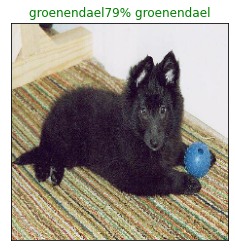

In [92]:
plot_pred(prediction_probabilities = predictions, 
          labels=val_labels, 
          images =  val_images,
          n=77)

Now we've got one function to visualize our models top predictions, let's make another view our model top 10 predictions

This function will:
* Take an input of prediction probabilities and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes.
  * Prediction probablities values.
  * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true lables


In [93]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

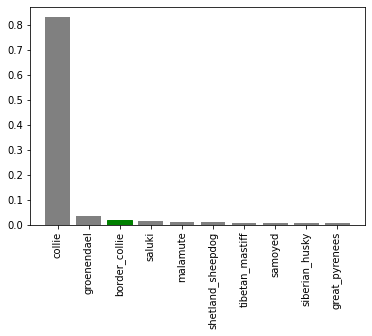

In [94]:
plot_pred_conf(prediction_probabilities=predictions, 
               labels=val_labels, 
               n = 9)

In [95]:
predictions[0]

array([8.16154236e-04, 3.85344902e-05, 1.15143508e-03, 1.18431133e-04,
       5.78850100e-04, 1.07525520e-04, 6.69957176e-02, 4.10075160e-03,
       3.68431589e-04, 4.44943667e-04, 5.76046761e-03, 5.57173451e-04,
       9.91922920e-04, 1.24419108e-04, 2.70607910e-04, 4.02043108e-03,
       3.65996311e-05, 2.86928833e-01, 6.76516865e-05, 3.03211476e-04,
       3.27597861e-03, 3.36002384e-04, 2.70792207e-05, 3.45596083e-04,
       9.52647024e-05, 1.43728714e-04, 1.66387841e-01, 3.09652387e-04,
       1.09541602e-03, 2.14713044e-04, 1.53063505e-04, 9.88159445e-04,
       6.27827016e-04, 2.05753786e-05, 3.78100434e-04, 7.63498023e-02,
       3.44413747e-05, 2.63280992e-04, 1.75463974e-05, 2.49072065e-04,
       7.24412908e-04, 1.55433790e-05, 5.63952315e-04, 8.89927673e-04,
       2.04347380e-05, 1.04291335e-04, 4.39243777e-05, 2.83262023e-04,
       6.94368384e-04, 9.79793724e-04, 1.12340385e-04, 5.09225611e-05,
       6.89418055e-04, 1.37358089e-04, 1.48470150e-04, 4.75973411e-06,
      

In [96]:
# To get the indexes of the top 10 values at index 0 
predictions[0].argsort()[-10:][::-1]

array([ 17,  26,  35,   6,  59, 102, 103,  70,  79, 106])

In [97]:
# To get the values of the top 10 indexes at index 0 
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.28692883, 0.16638784, 0.0763498 , 0.06699572, 0.05306482,
       0.04604157, 0.03325412, 0.03149879, 0.02399364, 0.02395054],
      dtype=float32)

In [98]:
predictions[0].max()

0.28692883

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

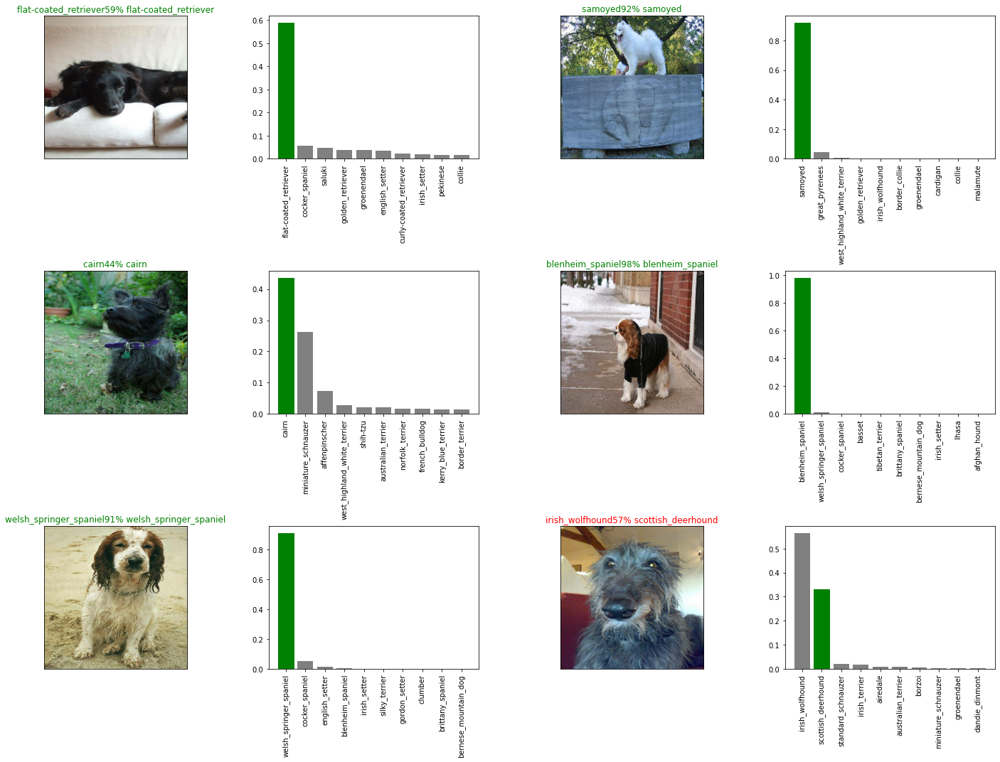

In [99]:
# Let's check out a few predictions and their difference values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions, 
                 labels = val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [100]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Save a given model in a models directory and appends a suffix (string)
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/My Drive/Projects/ML/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))

  model_path = modeldir + '-' + suffix + '.h5' # save format of model

  print(f'Saving model to:{model_path}....')
  model.save(model_path)
  return model_path

In [101]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

### Now we've got functions to save and load a trained model, let's make sure they work!

In [102]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to:drive/My Drive/Projects/ML/Dog Vision/models/20211209-14191639059592-1000-images-mobilenetv2-Adam.h5....


'drive/My Drive/Projects/ML/Dog Vision/models/20211209-14191639059592-1000-images-mobilenetv2-Adam.h5'

In [103]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Projects/ML/Dog Vision/models/20211209-14191639059592-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Projects/ML/Dog Vision/models/20211209-14191639059592-1000-images-mobilenetv2-Adam.h5


In [104]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 123ms/step - loss: 1.2754 - accuracy: 0.6850


[1.2753691673278809, 0.6850000023841858]

In [105]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 159ms/step - loss: 1.2754 - accuracy: 0.6850


[1.2753691673278809, 0.6850000023841858]

# Training a big dog model 🐶(on the full data)

In [106]:
len(X), len(y)

(10222, 10222)

In [108]:
X[:10]

['drive/My Drive/Projects/ML/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [109]:
X_train[:10]

['drive/My Drive/Projects/ML/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [110]:
len(X_train)

800

In [111]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [112]:
# Creata a databatch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [113]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [114]:
# Create a model for full dataset
full_model = create_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [115]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience = 3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [116]:
# Fit the full model to the full data
# *************************************** Uncomment below lines if running for the first time*******************************************************
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 60s 172ms/step - loss: 1.3334 - accuracy: 0.6694
Epoch 2/100
320/320 [==============================] - 53s 166ms/step - loss: 0.4112 - accuracy: 0.8808
Epoch 3/100
320/320 [==============================] - 55s 171ms/step - loss: 0.2433 - accuracy: 0.9314
Epoch 4/100
320/320 [==============================] - 54s 170ms/step - loss: 0.1547 - accuracy: 0.9632
Epoch 5/100
320/320 [==============================] - 55s 171ms/step - loss: 0.1086 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 53s 164ms/step - loss: 0.0798 - accuracy: 0.9845
Epoch 7/100
320/320 [==============================] - 54s 169ms/step - loss: 0.0601 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 59s 185ms/step - loss: 0.0479 - accuracy: 0.9922
Epoch 9/100
320/320 [==============================] - 58s 182ms/step - loss: 0.0379 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 59s 183m

In [117]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to:drive/My Drive/Projects/ML/Dog Vision/models/20211209-14501639061417-full-image-set-mobilenetv2-Adam.h5....


'drive/My Drive/Projects/ML/Dog Vision/models/20211209-14501639061417-full-image-set-mobilenetv2-Adam.h5'

In [118]:
# Loading the full model
loaded_full_model = load_model('drive/My Drive/Projects/ML/Dog Vision/models/20211209-14501639061417-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Projects/ML/Dog Vision/models/20211209-14501639061417-full-image-set-mobilenetv2-Adam.h5


In [119]:
len(X)

10222

## Making prediction on Test Dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which take a list of filenames as input and convert them into Tensors batches.

To make predictions on the test data, we'll :
* Get the test image filenames.
* Convert the filenames into test_data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method call on our model.

In [152]:
# Load test image filenames
test_path = 'drive/My Drive/Projects/ML/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Projects/ML/Dog Vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/My Drive/Projects/ML/Dog Vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [129]:
len(test_filenames)

10357

In [130]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [131]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `perdict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr).

In [161]:
# Make predictions on test batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 50s 153ms/step


In [162]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/My Drive/Projects/ML/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [163]:
# Load predictions (NumPy array) from csv file
test_perdictions = np.loadtxt('drive/My Drive/Projects/ML/Dog Vision/preds_array.csv', delimiter=',')

In [164]:
test_predictions[:10]

array([[3.0058910e-11, 2.5449369e-12, 4.8512410e-15, ..., 9.7867610e-14,
        3.7328487e-09, 1.5523758e-11],
       [1.1884813e-06, 6.3278452e-07, 1.3683861e-08, ..., 6.7989225e-12,
        9.1443066e-09, 1.5639849e-10],
       [8.9197304e-12, 9.5265739e-07, 1.5385171e-09, ..., 2.0028250e-07,
        9.1074604e-12, 1.2885315e-11],
       ...,
       [4.4254098e-10, 1.5669237e-11, 4.6644784e-12, ..., 3.7816468e-13,
        1.1439951e-13, 6.5065440e-12],
       [4.7673150e-12, 1.8575076e-10, 1.5436766e-11, ..., 4.3385492e-07,
        1.7157001e-10, 2.1526329e-12],
       [2.0247723e-10, 7.4565354e-12, 6.7123698e-12, ..., 1.6320044e-13,
        3.0383055e-12, 3.7674035e-08]], dtype=float32)

In [165]:
test_predictions.shape

(10357, 120)

## Perparing test dataset predictions for Kaggle

Looking at the Kaggle sample submision, we find that it wants our model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the perdiction probabilities) to each of the dog breed columns.

In [166]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [167]:
# Append test image ID's to prediction DataFrame
test_ids = [os.path.splitext(path) [0] for path in os.listdir(test_path)]
# test_ids # its working
preds_df['id'] = test_ids

In [168]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [172]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,3.00589e-11,2.54494e-12,4.85124e-15,1.02184e-13,6.89502e-14,4.27384e-12,5.15301e-17,4.01751e-13,1.12078e-13,1.55723e-11,1.40303e-14,4.24548e-12,7.47691e-14,3.48654e-10,1.47218e-14,1.00763e-13,3.70534e-14,4.38791e-14,9.88521e-12,1.45627e-12,1.74993e-14,4.88589e-12,1.24748e-12,2.26013e-14,6.80888e-14,1.64225e-10,2.47094e-13,1.11008e-16,2.99099e-15,8.33347e-12,2.32932e-13,3.80664e-13,5.12952e-14,2.09348e-10,4.56421e-15,6.61214e-17,1.22351e-12,5.8978e-14,3.14342e-13,...,3.82193e-15,2.79162e-16,7.32494e-14,4.47697e-13,2.61622e-09,5.6734e-07,2.84955e-13,2.46746e-10,5.36697e-12,5.33529e-15,1.32518e-13,1.25496e-13,7.11891e-12,3.73415e-12,1.3346e-12,4.34554e-12,2.71702e-14,2.61818e-14,7.32813e-11,1.03642e-09,2.04491e-09,2.23885e-11,2.61137e-12,2.06567e-14,1.70278e-14,6.25961e-14,1.8326e-14,6.75471e-14,5.57671e-13,1.99131e-11,3.22277e-12,2.22969e-14,3.07786e-14,2.61793e-15,3.10649e-14,1.11966e-12,2.91651e-13,9.78676e-14,3.73285e-09,1.55238e-11
1,00102ee9d8eb90812350685311fe5890,1.18848e-06,6.32785e-07,1.36839e-08,4.2953e-10,1.33427e-06,1.39382e-09,9.42742e-07,1.81402e-07,1.789e-08,2.13302e-08,1.22993e-08,2.92819e-08,3.23961e-06,9.00261e-09,1.14729e-07,2.28559e-08,7.9848e-07,2.02763e-10,1.05418e-06,9.79345e-09,8.86981e-10,3.76432e-06,1.53385e-08,3.5859e-09,3.15349e-08,4.26164e-07,2.12767e-09,7.16064e-07,6.17029e-09,8.83088e-10,0.00179096,5.90985e-08,8.74879e-08,7.82488e-06,1.59104e-08,1.00565e-07,5.62092e-05,1.7958e-06,6.89474e-07,...,5.97467e-08,4.35796e-06,1.51967e-06,2.35784e-09,1.95937e-07,1.78056e-08,3.81578e-06,0.000116662,1.34178e-07,8.06612e-08,8.74015e-08,2.52201e-07,2.39179e-06,2.81134e-08,0.984714,3.69615e-06,5.7189e-07,2.23293e-09,1.15683e-08,6.4431e-07,3.35326e-08,0.000117531,1.2076e-09,1.32615e-08,3.61059e-06,6.29422e-07,1.0781e-09,1.35313e-09,8.33229e-06,5.57192e-09,5.16386e-09,8.79771e-08,2.13864e-09,1.68295e-06,2.53822e-08,5.52184e-08,0.000132761,6.79892e-12,9.14431e-09,1.56398e-10
2,0012a730dfa437f5f3613fb75efcd4ce,8.91973e-12,9.52657e-07,1.53852e-09,1.52795e-11,6.55782e-11,4.05154e-09,3.39938e-12,1.30431e-12,3.27855e-10,5.27113e-13,3.25629e-11,6.31438e-12,2.83762e-11,4.68483e-08,1.16753e-11,9.06524e-08,3.5877e-12,1.79536e-13,0.000174821,3.13969e-13,1.01779e-10,1.33001e-08,8.61031e-12,1.44933e-08,1.34788e-08,2.61694e-11,2.69836e-10,8.22495e-13,3.17659e-10,2.71616e-13,3.68417e-13,1.12734e-06,4.99089e-08,6.66425e-10,4.02999e-10,4.51019e-12,1.71918e-13,7.75794e-12,1.97752e-08,...,6.68759e-13,1.56626e-13,1.2967e-11,3.86662e-08,9.64413e-10,2.47355e-09,6.34463e-13,6.22959e-11,8.35348e-11,2.06563e-10,8.36473e-08,7.33637e-10,5.22993e-08,8.48357e-07,2.00019e-12,6.74485e-16,1.70297e-12,1.19008e-06,5.69014e-09,7.514e-09,9.16669e-10,3.80683e-11,7.26224e-10,1.0717e-07,2.09948e-10,4.23535e-09,1.42685e-10,1.31167e-08,3.66267e-10,4.43316e-09,6.62463e-13,1.6774e-11,7.47468e-09,1.41314e-07,1.32311e-08,1.14064e-08,4.

In [174]:
# Save our predictions dataframe to CSV fro submission to Kaggle
preds_df.to_csv('drive/My Drive/Projects/ML/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv',
                index=False)

## Let's make predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()` and since our custom images won't have labels, we set the `test data` parameter to `True`.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [177]:
# Get custom image filepaths
custom_path = 'drive/My Drive/Projects/ML/Dog Vision/my-dog-photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [179]:
custom_image_paths

['drive/My Drive/Projects/ML/Dog Vision/my-dog-photos/dog-photo-1.jpeg',
 'drive/My Drive/Projects/ML/Dog Vision/my-dog-photos/dog-photo-3.jpeg',
 'drive/My Drive/Projects/ML/Dog Vision/my-dog-photos/dog-photo-2.jpeg']

In [180]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [183]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

(3, 120)

In [185]:
# Get custom image prediction label
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range (len(custom_preds))] 
custom_pred_labels

['golden_retriever', 'labrador_retriever', 'lakeland_terrier']

In [186]:
# Get custom images (our unbatchify ()) 
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

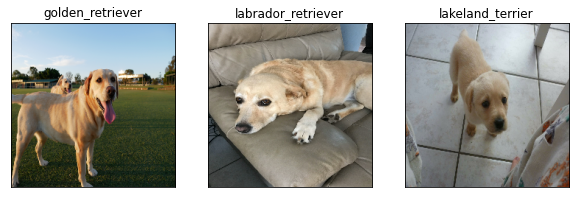

In [187]:
# Check the custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

<img src='https://c.tenor.com/b4lO60wXmQoAAAAd/the-work-is-done-josh2funny.gif'>